# Assignment 1: The standard map
The standard map is defined as

$$F: \begin{pmatrix}x \\ y \end{pmatrix} = \begin{pmatrix}x + a \sin{(x+y)} \\ x + y \end{pmatrix}$$
with $x, y \in \mathbb{R}/[-\pi, \pi]$.

We know the following:
- $(0, 0)$ is a fixed point, i.e. $F\begin{pmatrix}0 \\ 0 \end{pmatrix} = \begin{pmatrix}0 \\ 0 \end{pmatrix}$
- $(\pi, 0)$ is a 2 periodic point, i.e. $F\left(F\begin{pmatrix}\pi \\ 0 \end{pmatrix}\right) = F\begin{pmatrix} \pi \\ \pi  \end{pmatrix} = \begin{pmatrix}\pi \\ 2\pi \end{pmatrix} = \begin{pmatrix} \pi \\ 0 \end{pmatrix}$

Draw the phase diagram for $a = -0.7$

The derivative of $F$ is:

$$DF\begin{pmatrix}x  \\ y\end{pmatrix} = \begin{pmatrix}1 + a\cos(x+y) & a\cos(x+y)  \\ 1 & 1\end{pmatrix}$$


In [84]:
import numpy as np
import matplotlib.pyplot as plt

def f(x, a=-0.7):
    """
    Standard map function, in the domain [-pi, pi]
    """
    next_x1 = (x[0] + a*np.sin(x[0] + x[1]))%(2*np.pi)
    if next_x1 > np.pi:
        next_x1 -= 2*np.pi
    next_x2 = (x[0] + x[1])%(2*np.pi)
    if next_x2 > np.pi:
        next_x2 -= 2*np.pi
    return np.array([next_x1, next_x2])

def get_orbit(x0, f, a=-0.7, lim_iter = 10, tol=1e-10):
    """
    Get an orbit given initial conditions.
    """
    # Current x is x0
    x = x0
    # To save results
    x1_vec = []
    x2_vec = []
    # Stop condition starts with false
    
    for n_iter in np.arange(lim_iter):
        next_x = f(x, a)
        # Stop condition
        stop_cond = next_x[0] in x1_vec and next_x[1] in x2_vec
        if stop_cond:
            print(f'{x0} is {n_iter} periodic.')
            break
        # Save results
        x1_vec.append(next_x[0])
        x2_vec.append(next_x[1])
        # Update current x
        x = next_x
        
    return np.array(x1_vec), np.array(x2_vec)
    

In [14]:
# Checking fixed  and perodic points
x = np.array([0, 0])
print(f"The image of {x} is {f(x)}. It's a fixed point.")
#get_orbit(x, f)

x = np.array([np.pi, 0])
print(f"The image of the image of {x} is {f(f(x))}. It's a 2 periodic point.")
#get_orbit(x, f)

The image of [0 0] is [0. 0.]. It's a fixed point.
The image of the image of [3.14159265 0.        ] is [3.14159265 0.        ]. It's a 2 periodic point.


<IPython.core.display.Javascript object>


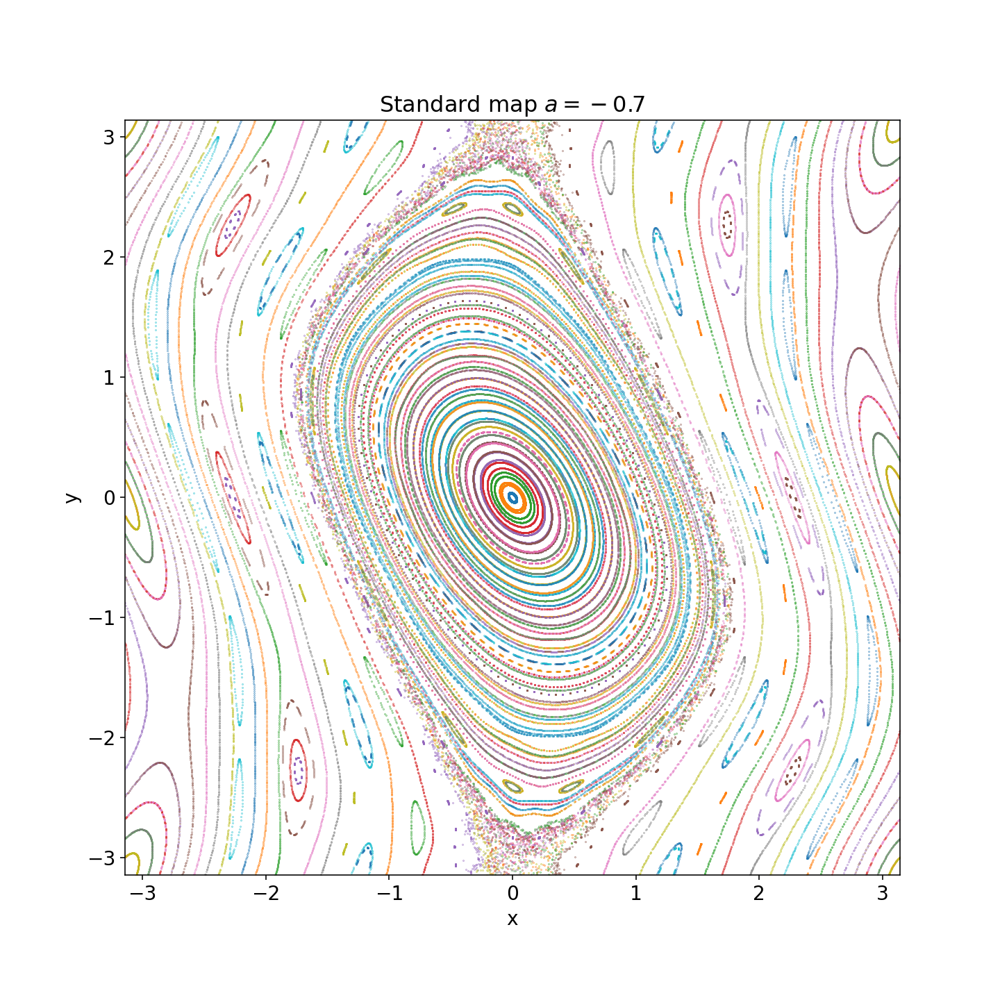

[-3.14159265  0.        ] is 2 periodic.
[3.14159265 0.        ] is 2 periodic.
[ 0.         -3.14159265] is 2 periodic.
[0.         3.14159265] is 1 periodic.


In [85]:
%matplotlib notebook
# Define initial conditions
set_x_ic = np.linspace(-np.pi, np.pi, 100)
lim_iter = 500
plt.figure(figsize=(10, 10))
for x1_0 in set_x_ic:
    x0 = np.array([x1_0, 0])
    x1_arr, x2_arr = get_orbit(x0, f, lim_iter=lim_iter)
    plt.plot(x1_arr, x2_arr, '.', markersize=0.5)
    
for x2_0 in set_x_ic:
    x0 = np.array([0, x2_0])
    x1_arr, x2_arr = get_orbit(x0, f, lim_iter=lim_iter)
    plt.plot(x1_arr, x2_arr, '.', markersize=0.5)

plt.xlabel('x', fontsize=14)
plt.ylabel('y', fontsize=14)
plt.tick_params(labelsize=14)
plt.axis([-np.pi, np.pi, -np.pi, np.pi])
plt.title(r'Standard map $a=-0.7$', fontsize=16)
plt.savefig('stand_map_a-0_7', format='png')

In [70]:
def newton_method(x0, func, dfunc, max_iter=1000, tol=1e-16):
    x = x0
    num_iter = 0
    while num_iter <= max_iter:
        increment = np.dot(np.linalg.inv(dfunc(x)), func(x))
        x1 = x - increment
        x = x1
        if (np.abs(func(x1)[0]) < tol) and (np.abs(func(x1)[1]) < tol):
            print('num iter: ', num_iter)
            return x
        num_iter += 1
    raise ValueError('max iter reach')

num iter:  2
Our 3-periodic point is ['2.12277800410538' '-4.3258970421088984e-13']
Check:  True
[ 2.12277800e+00 -4.32589704e-13] is 3 periodic.


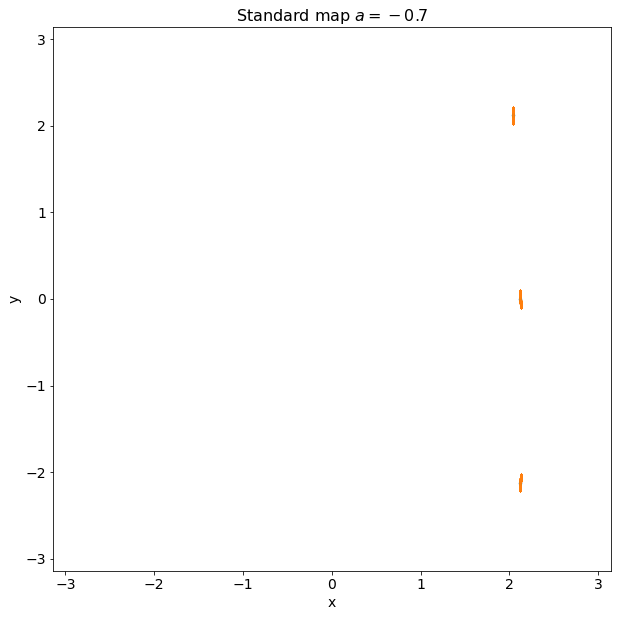

In [156]:
# 3 PERIODIC POINT
from scipy.optimize import newton

a = -0.7

# We start with an approximation we got from zooming in in the plot
x0_3p = np.array([1.7, 2.3])


def h_func3(x):
    return f(f(f(x, a), a), a)

def g_func3(x):
    return h_func3(x)- x

def DF(x):
    """ Derivative of f function"""
    return np.array([[1+a*np.cos(x[0]+x[1]), a*np.cos(x[0]+x[1])],
                     [1, 1]])

def DH3(x):
    """ Derivative of H function"""
    return DF(f(f(x, a), a))@DF(f(x, a))@DF(x)

def DG3(x):
    return (DH3(x) - np.eye(2)) # The derivative of the vector x is the identity matrix

x_3p = newton_method(x0=x0_3p, func=g_func3, dfunc=DG3, max_iter=10000, tol=1e-15)

print(f'Our 3-periodic point is {x_3p.astype(str)}')
print('Check: ', np.allclose(x_3p, f(f(f(x_3p, a), a), a), atol=1e-15))

%matplotlib inline
plt.figure(figsize=(10, 10))
x1_arr_3p, x2_arr_3p = get_orbit(x_3p, f, a=a, lim_iter=100)
plt.plot(x1_arr_3p, x2_arr_3p, '.', markersize=5)

h = np.array([0.1, 0.1])
x1_arr_3p, x2_arr_3p = get_orbit(x_3p + h, f, a=a, lim_iter=10000)
plt.plot(x1_arr_3p, x2_arr_3p, '.', markersize=0.5)
plt.xlabel('x', fontsize=14)
plt.ylabel('y', fontsize=14)
plt.tick_params(labelsize=14)
plt.axis([-np.pi, np.pi, -np.pi, np.pi])
plt.title(r'Standard map $a=-0.7$', fontsize=16)
plt.savefig('3_periodic', format='png')

num iter:  3
Our 4-periodic point is ['1.901797439828002' '-5.297841102480104e-15']
Check:  True
[ 1.90179744e+00 -5.29784110e-15] is 4 periodic.


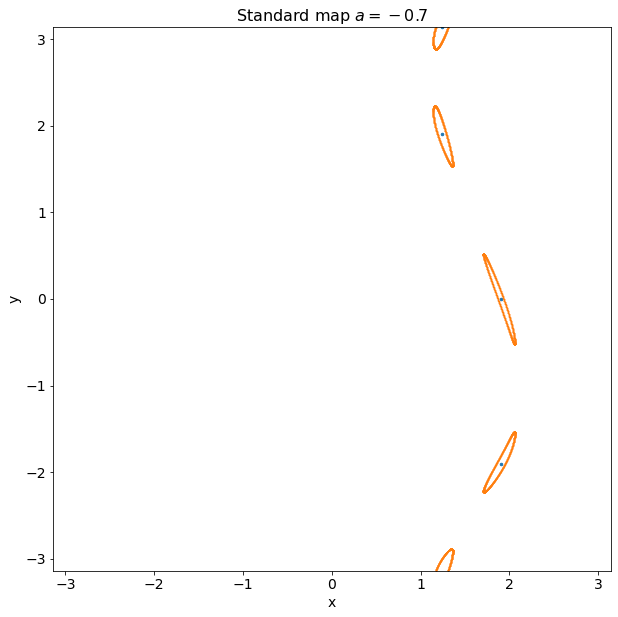

In [72]:
# 4-PERIODIC POINT
# We start with an approximation we got from zooming in in the plot
from scipy.optimize import newton

a = -0.7

x0_4p = np.array([1.9, 0])


def h_func4(x, a=-0.7):
    return f(f(f(f(x, a), a), a), a)

def g_func4(x, a=-0.7):
    return h_func4(x, a) - x

def DH4(x):
    """ Derivative of H function"""
    # return DF(f(f(f(x, a), a), a))*DF(f(f(x, a),a))*DF(f(x, a))*DF(x)
    return DF(f(f(f(x, a), a), a))@DF(f(f(x, a), a))@DF(f(x, a))@DF(x)

def DG4(x):
    return (DH4(x) - np.eye(2)) # The derivative of the vector x is the identity matrix


x_4p = newton_method(x0=x0_4p, func=g_func4, dfunc=DG4, max_iter=10000, tol=1e-16)
print(f'Our 4-periodic point is {x_4p.astype(str)}')
print('Check: ', np.allclose(x_4p, f(f(f(f(x_4p, a), a), a), a), atol=1e-16))
plt.figure(figsize=(10, 10))
x1_arr, x2_arr = get_orbit(x_4p, f, lim_iter=500)
plt.plot(x1_arr, x2_arr, '.', markersize=5)
h = np.array([0.05, -0.05])
x1_arr_4p, x2_arr_4p = get_orbit(x_4p + h, f, a=a, lim_iter=10000)
plt.plot(x1_arr_4p, x2_arr_4p, '.', markersize=0.5)
plt.xlabel('x', fontsize=14)
plt.ylabel('y', fontsize=14)
plt.tick_params(labelsize=14)
plt.axis([-np.pi, np.pi, -np.pi, np.pi])
plt.title(r'Standard map $a=-0.7$', fontsize=16)
plt.savefig('4_periodic', format='png')
plt.show()

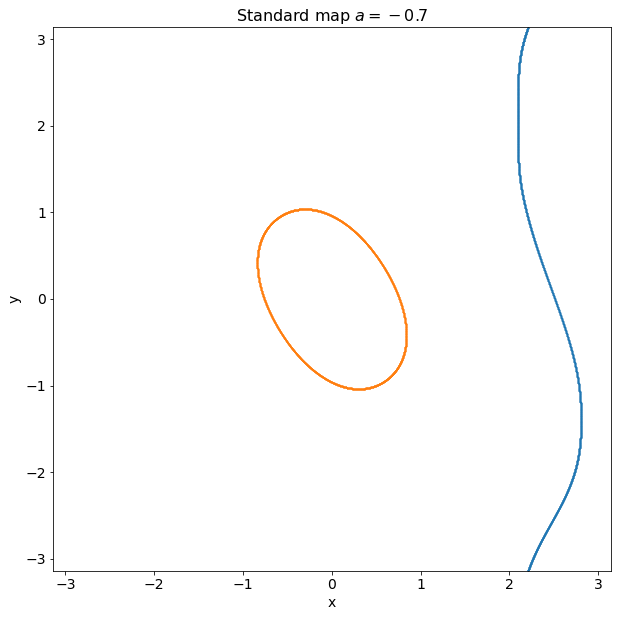

In [48]:
# Vertical and circular invariants
%matplotlib inline
plt.figure(figsize=(10, 10))

x0 = np.array([2.0964, 2.111])
x1_arr, x2_arr = get_orbit(x0, f, lim_iter=10000)
plt.plot(x1_arr, x2_arr, '.', markersize=0.5)
x0 = np.array([0.5, 0.5])
x1_arr, x2_arr = get_orbit(x0, f, lim_iter=10000)
plt.plot(x1_arr, x2_arr, '.', markersize=0.5)
plt.xlabel('x', fontsize=14)
plt.ylabel('y', fontsize=14)
plt.tick_params(labelsize=14)
plt.axis([-np.pi, np.pi, -np.pi, np.pi])
plt.title(r'Standard map $a=-0.7$', fontsize=16)
plt.savefig('invariant_curves', format='png')
plt.show()

[0. 0.] is 1 periodic.


<IPython.core.display.Javascript object>


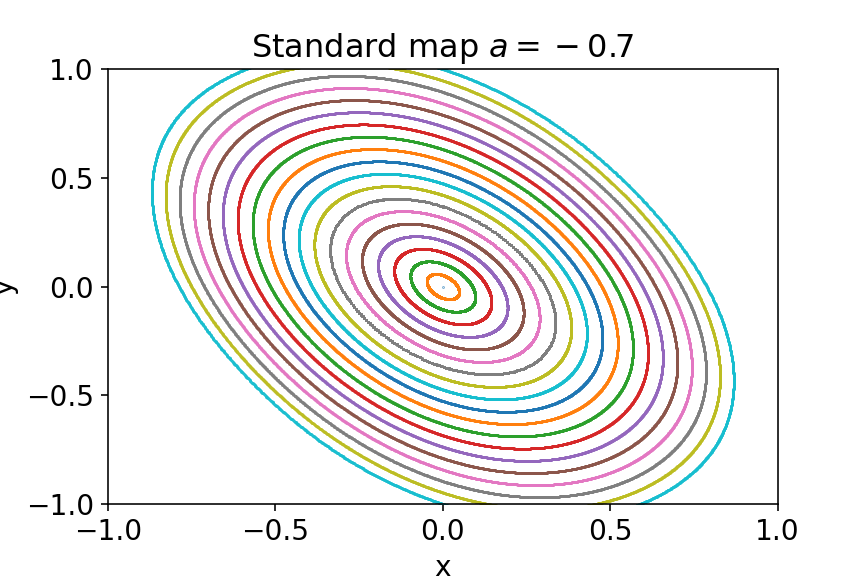

In [137]:
# Interesting behavior -- central exploration
%matplotlib notebook
from scipy.optimize import newton

a = -0.7

interesting_ic = [x0_5p, x0_6p, x0_7p,
                 np.array([1.7466, 1.5]),
                 np.array([1.43, 2.82]),
                 np.array([1.2431, 1.8984]),
                 np.array([1.1145, 1.7981]),
                 np.array([1.0317, 1.7272]),
                 np.array([0.9304, 1.6522])]


for _y0 in np.linspace(0, 1, 20):
    _x0 = np.array([0, _y0])
    x1_arr, x2_arr = get_orbit(_x0, f, lim_iter=5000)
    plt.plot(x1_arr, x2_arr, '.', markersize=.5)

plt.xlabel('x', fontsize=14)
plt.ylabel('y', fontsize=14)
plt.tick_params(labelsize=14)
plt.axis([-1, 1, -1, 1])
plt.title(r'Standard map $a=-0.7$', fontsize=16)
#plt.savefig('4_periodic', format='png')
plt.show()

[0. 0.] is 1 periodic.


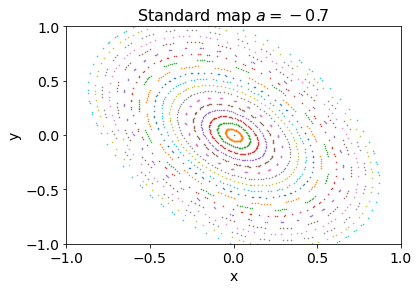

In [93]:
# Central exploration
%matplotlib inline
from scipy.optimize import newton

a = -0.7

interesting_ic = [x0_5p, x0_6p, x0_7p,
                 np.array([1.7466, 1.5]),
                 np.array([1.43, 2.82]),
                 np.array([1.2431, 1.8984]),
                 np.array([1.1145, 1.7981]),
                 np.array([1.0317, 1.7272]),
                 np.array([0.9304, 1.6522])]

plt.figure(figsize=(6, 4))

for _y0 in np.linspace(0, 1, 20):
    _x0 = np.array([0, _y0])
    x1_arr, x2_arr = get_orbit(_x0, f, lim_iter=100)
    plt.plot(x1_arr, x2_arr, '.', markersize=1)

plt.xlabel('x', fontsize=14)
plt.ylabel('y', fontsize=14)
plt.tick_params(labelsize=14)
plt.axis([-1, 1, -1, 1])
plt.title(r'Standard map $a=-0.7$', fontsize=16)
plt.savefig('center_incomp.png', format='png')
plt.show()

In [132]:
# Some periodic islands and elliptic invariant curves around the center
%matplotlib notebook
from scipy.optimize import newton

a = -0.7

interesting_ic = [np.array([0, 2.45]),
                  np.array([0, 2.5]) + np.array([0, 0.05]),
                  np.array([0, 2.35]),
                  np.array([0, 2.33]),
                  np.array([0.225, 2.4662]),
                  np.array([0, 2.85])
                  ]


for _ic in interesting_ic:
    x1_arr, x2_arr = get_orbit(_ic, f, lim_iter=10000)
    plt.plot(x1_arr, x2_arr, '.', markersize=.5)

plt.xlabel('x', fontsize=14)
plt.ylabel('y', fontsize=14)
plt.tick_params(labelsize=14)
plt.axis([-np.pi, np.pi, -np.pi, np.pi])
plt.title(r'Standard map $a=-0.7$', fontsize=16)
#plt.savefig('4_periodic', format='png')
plt.show()

<IPython.core.display.Javascript object>

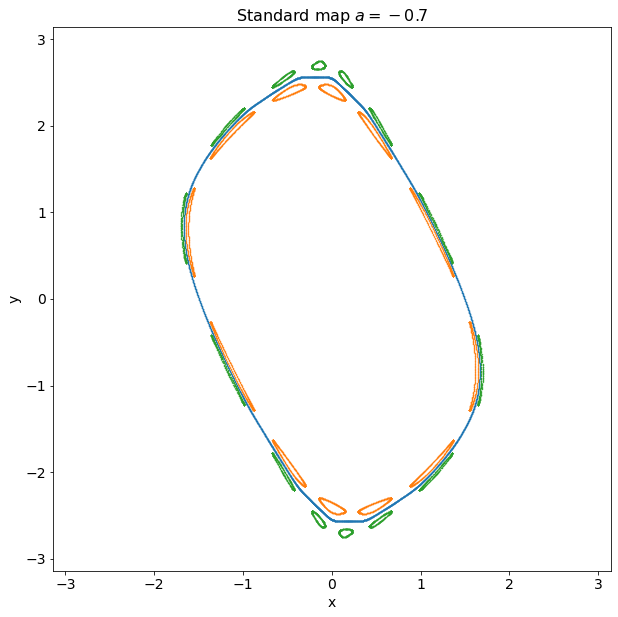

In [134]:
# More exploration in the same region
%matplotlib inline
from scipy.optimize import newton

a = -0.7

new_int = [interesting_ic[i] for i in [1, 2, 4]]

plt.figure(figsize=(10, 10))
for _ic in new_int:
    x1_arr, x2_arr = get_orbit(_ic, f, lim_iter=10000)
    plt.plot(x1_arr, x2_arr, '.', markersize=.5)

plt.xlabel('x', fontsize=14)
plt.ylabel('y', fontsize=14)
plt.tick_params(labelsize=14)
plt.axis([-np.pi, np.pi, -np.pi, np.pi])
plt.title(r'Standard map $a=-0.7$', fontsize=16)
plt.savefig('higher_periodics_inv_curv.png', format='png')
plt.show() #(12, 14, 16)

<IPython.core.display.Javascript object>


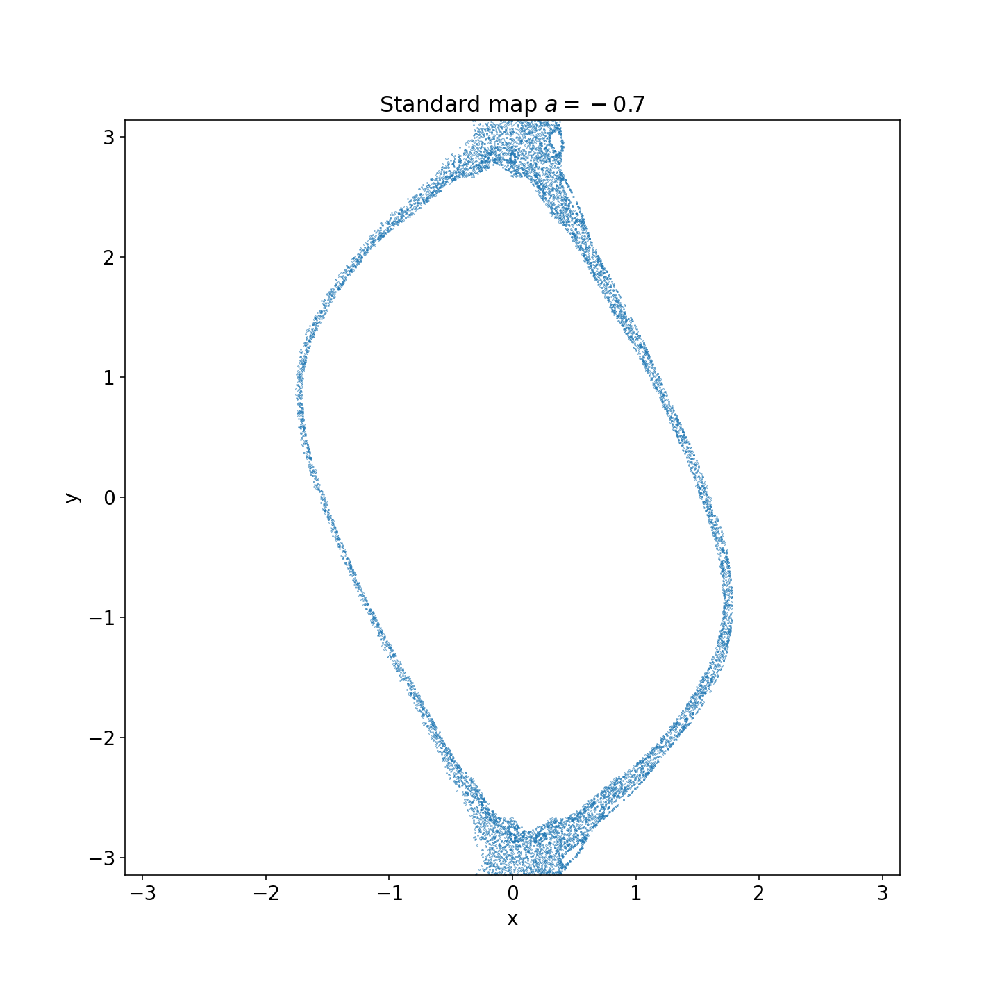

In [135]:
# Find a 4-periodic point
# We start with an approximation we got from zooming in in the plot
%matplotlib notebook
from scipy.optimize import newton

a = -0.7

interesting_ic = [np.array([0.164, 2.696]),]

plt.figure(figsize=(10, 10))
for _ic in interesting_ic:
    x1_arr, x2_arr = get_orbit(_ic, f, lim_iter=10000)
    plt.plot(x1_arr, x2_arr, '.', markersize=.5)

plt.xlabel('x', fontsize=14)
plt.ylabel('y', fontsize=14)
plt.tick_params(labelsize=14)
plt.axis([-np.pi, np.pi, -np.pi, np.pi])
plt.title(r'Standard map $a=-0.7$', fontsize=16)
plt.savefig('chaos.png', format='png')
plt.show()

In [147]:
np.round(new_a,1)

-1.9

[-3.14159265  0.        ] is 2 periodic.
[3.14159265 0.        ] is 2 periodic.
[ 0.         -3.14159265] is 2 periodic.
[0.         3.14159265] is 1 periodic.


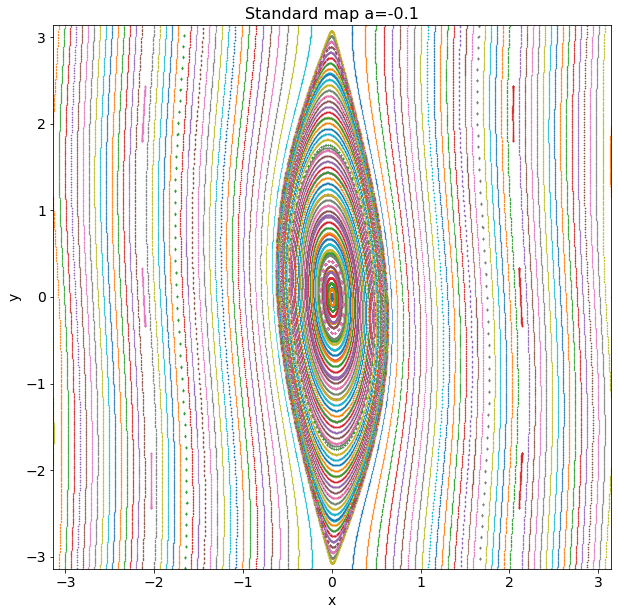

[-3.14159265  0.        ] is 2 periodic.
[3.14159265 0.        ] is 2 periodic.
[ 0.         -3.14159265] is 2 periodic.
[0.         3.14159265] is 1 periodic.


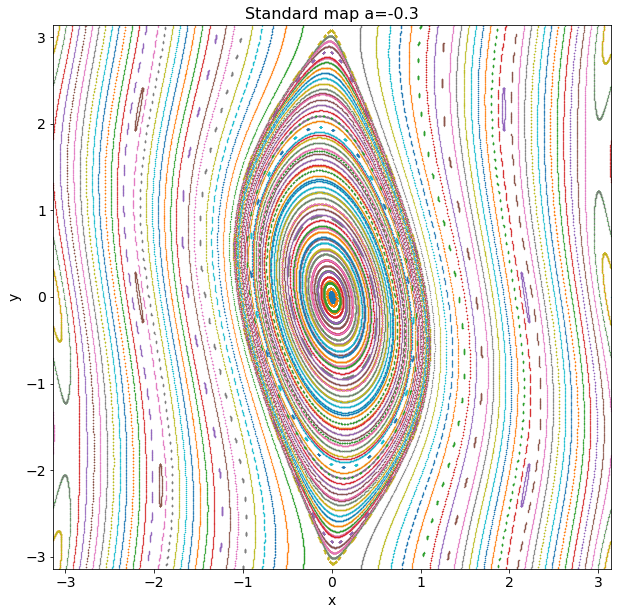

[-3.14159265  0.        ] is 2 periodic.
[3.14159265 0.        ] is 2 periodic.
[ 0.         -3.14159265] is 2 periodic.
[0.         3.14159265] is 1 periodic.


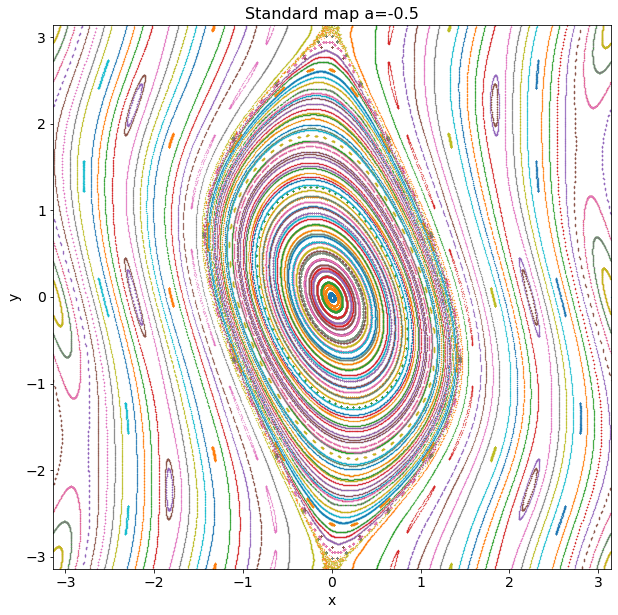

[-3.14159265  0.        ] is 2 periodic.
[3.14159265 0.        ] is 2 periodic.
[ 0.         -3.14159265] is 2 periodic.
[0.         3.14159265] is 1 periodic.


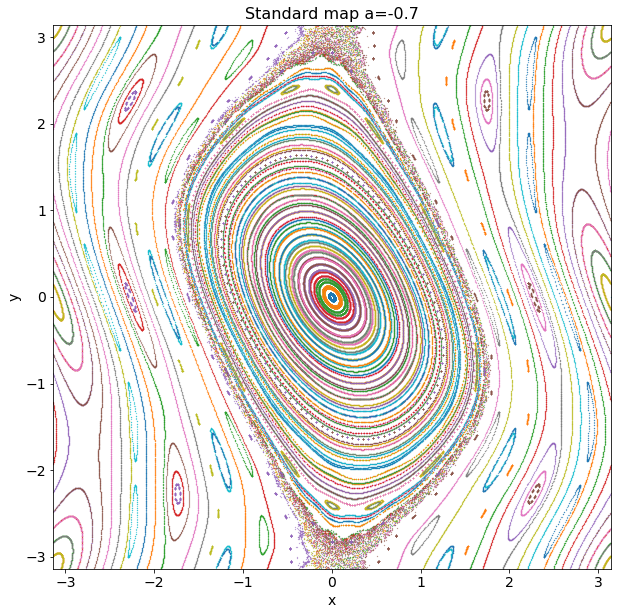

[-3.14159265  0.        ] is 2 periodic.
[3.14159265 0.        ] is 2 periodic.
[ 0.         -3.14159265] is 2 periodic.
[0.         3.14159265] is 1 periodic.


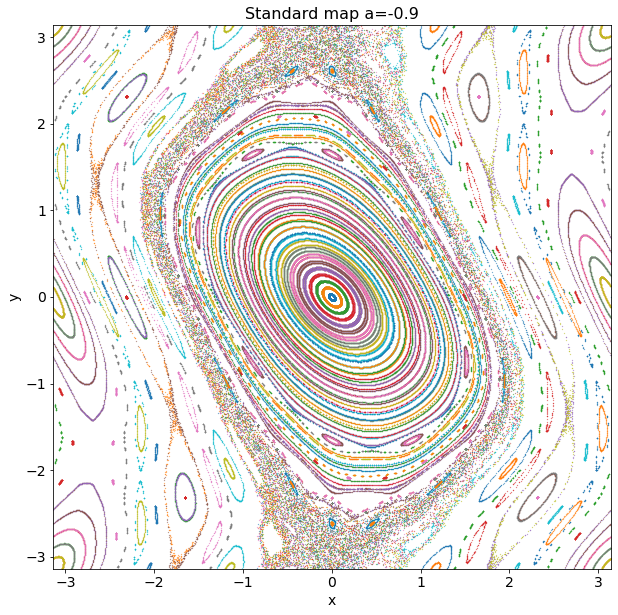

[-3.14159265  0.        ] is 8 periodic.
[3.14159265 0.        ] is 8 periodic.
[ 0.         -3.14159265] is 2 periodic.
[0.         3.14159265] is 1 periodic.


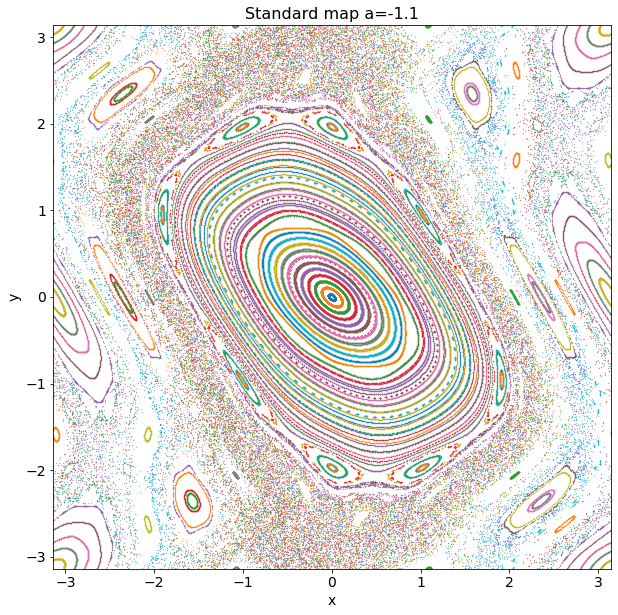

[-3.14159265  0.        ] is 13 periodic.
[3.14159265 0.        ] is 13 periodic.
[ 0.         -3.14159265] is 2 periodic.
[0.         3.14159265] is 1 periodic.


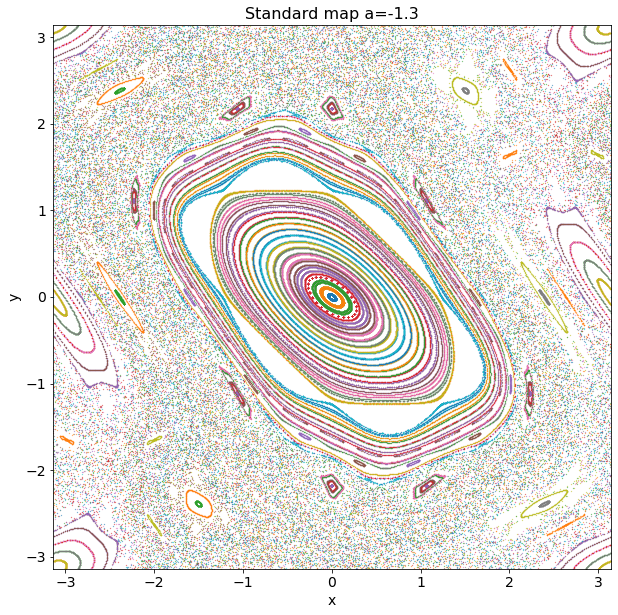

[-3.14159265  0.        ] is 4 periodic.
[3.14159265 0.        ] is 4 periodic.
[ 0.         -3.14159265] is 2 periodic.
[0.         3.14159265] is 1 periodic.


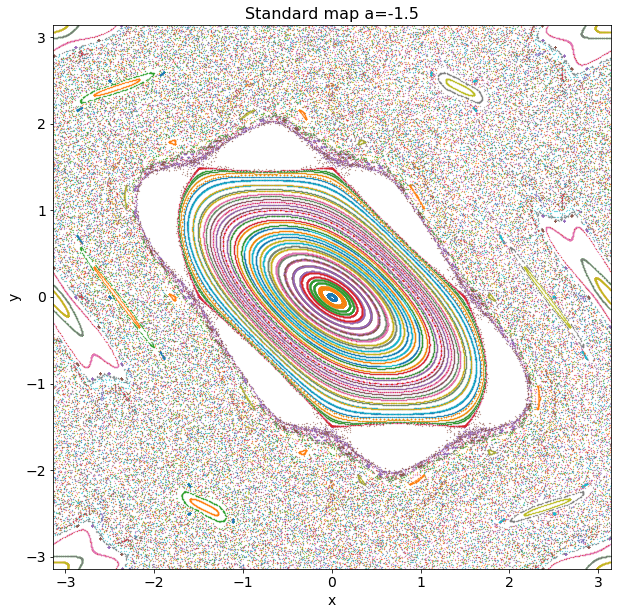

[-3.14159265  0.        ] is 6 periodic.
[3.14159265 0.        ] is 6 periodic.
[ 0.         -3.14159265] is 2 periodic.
[0.         3.14159265] is 1 periodic.


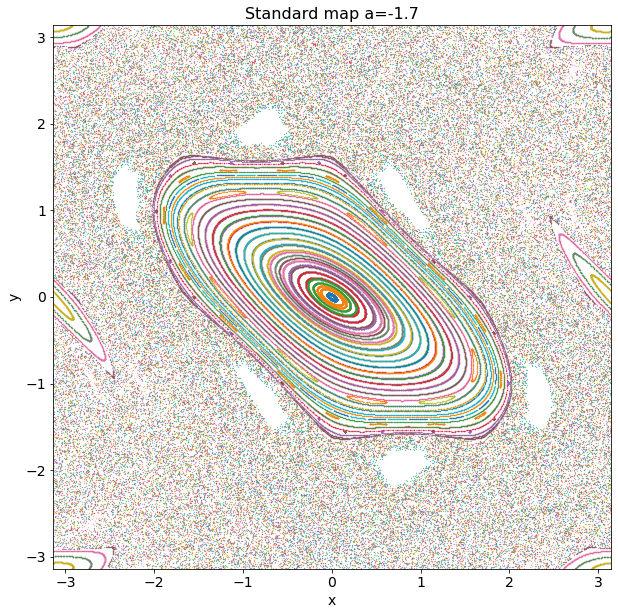

[-3.14159265  0.        ] is 72 periodic.
[3.14159265 0.        ] is 2 periodic.
[0.         3.14159265] is 1 periodic.


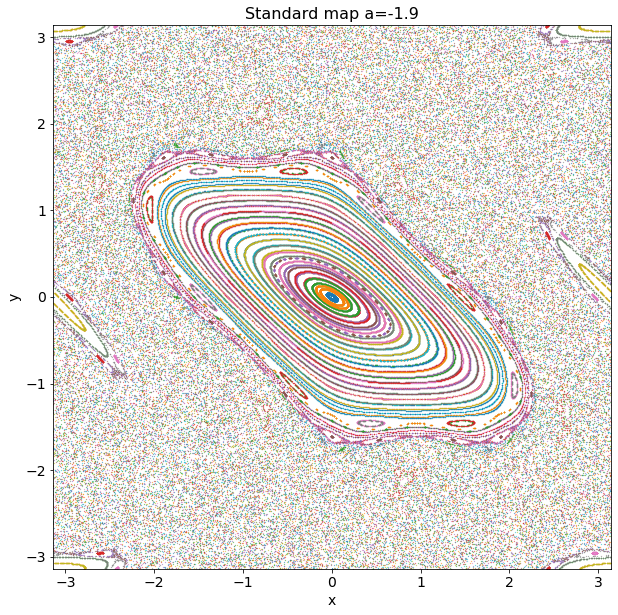

[3.14159265 0.        ] is 2 periodic.
[0.         3.14159265] is 1 periodic.


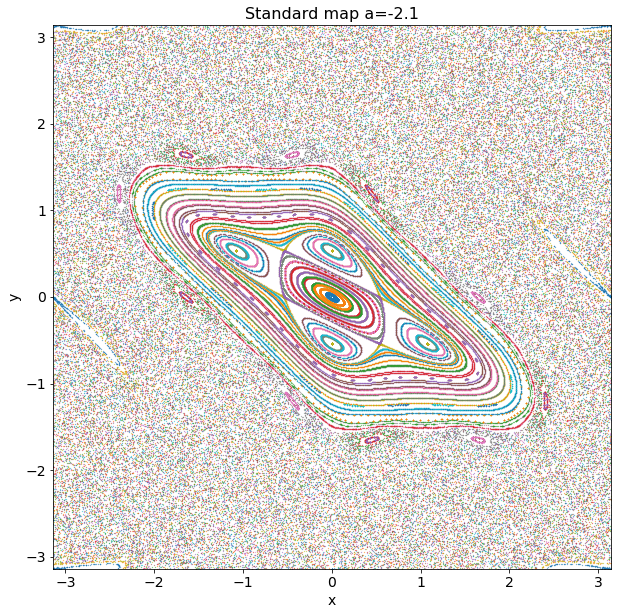

In [151]:
%matplotlib inline
set_x_ic = np.linspace(-np.pi, np.pi, 100)
lim_iter = 1000

for new_a in np.arange(-0.1, -2.3, -.2):
    new_a = np.round(new_a, 1)
    plt.figure(figsize=(10, 10))
    for x1_0 in set_x_ic:
        x0 = np.array([x1_0, 0])
        x1_arr, x2_arr = get_orbit(x0, f, a=new_a, lim_iter=lim_iter)
        plt.plot(x1_arr, x2_arr, '.', markersize=0.5)

    for x2_0 in set_x_ic:
        x0 = np.array([0, x2_0])
        x1_arr, x2_arr = get_orbit(x0, f, a=new_a, lim_iter=lim_iter)
        plt.plot(x1_arr, x2_arr, '.', markersize=0.5)
    str_a = str(new_a).replace('.', 'p')
    plt.xlabel('x', fontsize=14)
    plt.ylabel('y', fontsize=14)
    plt.tick_params(labelsize=14)
    plt.axis([-np.pi, np.pi, -np.pi, np.pi])
    plt.title(f'Standard map a={new_a}', fontsize=16)
    plt.savefig(f'standard_map_{str_a}.png')
    plt.show()

<IPython.core.display.Javascript object>


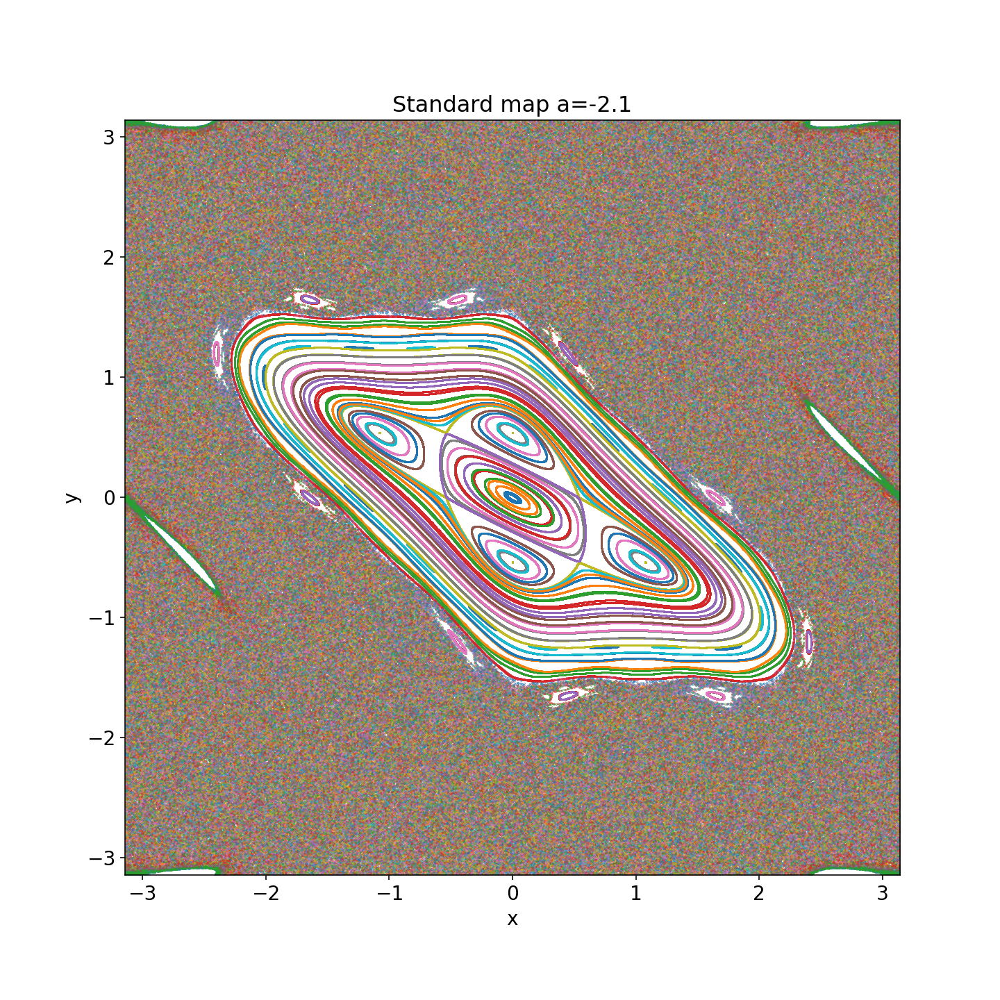

[3.14159265 0.        ] is 2 periodic.
[0.         3.14159265] is 1 periodic.


In [158]:
# Better picture of chaos
%matplotlib notebook
lim_iter = 10000
new_a = a = -2.1
plt.figure(figsize=(10, 10))
for x1_0 in set_x_ic:
    x0 = np.array([x1_0, 0])
    x1_arr, x2_arr = get_orbit(x0, f, a=new_a, lim_iter=lim_iter)
    plt.plot(x1_arr, x2_arr, '.', markersize=0.5)

for x2_0 in set_x_ic:
    x0 = np.array([0, x2_0])
    x1_arr, x2_arr = get_orbit(x0, f, a=new_a, lim_iter=lim_iter)
    plt.plot(x1_arr, x2_arr, '.', markersize=0.5)
str_a = str(new_a).replace('.', 'p')
plt.xlabel('x', fontsize=14)
plt.ylabel('y', fontsize=14)
plt.tick_params(labelsize=14)
plt.axis([-np.pi, np.pi, -np.pi, np.pi])
plt.title(f'Standard map a={new_a}', fontsize=16)
plt.savefig(f'standard_map_{str_a}.png')
plt.show()